In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as snb
import plotly.express as px
import squarify

In [2]:
salesfact = pd.read_csv('Salesfact.csv',delimiter = ',',header = 0)
product = pd.read_csv('Product.csv',delimiter = ',',header = 0)
geography = pd.read_csv('Geography.csv',delimiter = ',',header = 0)

In [3]:
salesfact_product = pd.merge(salesfact,product, on = 'ProductID')
data = pd.merge(salesfact_product, geography, on = 'Zip')

__Xem thông tin Data__

In [4]:
data.head()

,ProductID,Date,Zip,Units,Revenue,COGS,Category,Segment,Product,City,State,Region,District
0,1228,7/31/2013,78773,12,"$19.648,44","$12.309,75",Urban,Convenience,Pirum UC-30,"Austin, TX",TX,Central,District #23
1,781,3/12/2014,90501,16,"$20.351,52","$13.497,13",Rural,Productivity,Natura RP-69,"Torrance, CA",CA,West,District #37
2,2090,11/29/2013,44460,26,"$111.367,62","$91.488,50",Urban,Convenience,Currus UC-25,"Salem, OH",OH,East,District #14
3,1116,8/29/2018,30122,12,"$36.280,44","$21.967,81",Rural,Select,Pirum RS-04,"Lithia Springs, GA",GA,East,District #09
4,993,4/27/2013,75789,14,"$55.557,18","$48.645,87",Urban,Convenience,Natura UC-56,"Troup, TX",TX,Central,District #24


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 976243 entries, 0 to 976242
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   ProductID  976243 non-null  int64 
 1   Date       976243 non-null  object
 2   Zip        976243 non-null  int64 
 3   Units      976243 non-null  int64 
 4   Revenue    976202 non-null  object
 5   COGS       976243 non-null  object
 6   Category   976243 non-null  object
 7   Segment    976243 non-null  object
 8   Product    976243 non-null  object
 9   City       976243 non-null  object
 10  State      976243 non-null  object
 11  Region     976243 non-null  object
 12  District   976243 non-null  object
dtypes: int64(3), object(10)
memory usage: 96.8+ MB


__Data Cleaning__

In [6]:
data['Revenue'] = data['Revenue'].str.replace('$','')
data['Revenue'] = data['Revenue'].str.replace('.','')
data['Revenue'] = data['Revenue'].str.replace(',','.')
data['Revenue'] = data['Revenue'].astype(float)
data['COGS'] = data['COGS'].str.replace('$','')
data['COGS'] = data['COGS'].str.replace('.','')
data['COGS'] = data['COGS'].str.replace(',','.')
data['COGS'] = data['COGS'].astype(float)

In [7]:
data['Date'] =pd.to_datetime(data['Date'])

In [8]:
data[data['Revenue'].isnull()]

,ProductID,Date,Zip,Units,Revenue,COGS,Category,Segment,Product,City,State,Region,District
319629,2197,2022-07-01,6379,1,NaN,0.0,Mix,All Season,Aliqui MA-11,"Pawcatuck, CT",CT,East,District #02
333052,2302,2022-06-17,89044,1,NaN,0.0,Urban,Regular,Aliqui UR-05,"Henderson, NV",NV,West,District #38
333126,2209,2022-06-25,92805,1,NaN,0.0,Rural,Productivity,Aliqui RP-06,"Anaheim, CA",CA,West,District #37
333237,912,2022-06-07,68521,1,NaN,0.0,Urban,Extreme,Natura UE-21,"Lincoln, NE",NE,Central,District #30
333337,2302,2022-07-01,98629,1,NaN,0.0,Urban,Regular,Aliqui UR-05,"La Center, WA",WA,West,District #34
333533,1542,2022-06-17,92086,1,NaN,0.0,Rural,Productivity,Quibus RP-34,"Warner Springs, CA",CA,West,District #38
333543,2302,2022-06-29,34758,1,NaN,0.0,Urban,Regular,Aliqui UR-05,"Kissimmee, FL",FL,East,District #12
333545,919,2022-06-28,94085,1,NaN,0.0,Urban,Extreme,Natura UE-28,"Sunnyvale, CA",CA,West,District #36
333731,1835,2022-06-26,60608,1,NaN,0.0,Youth,Youth,Pomum YY-30,"Chicago, IL",IL,Central,District #31
333890,2302,2022-06-28,80031,1,NaN,0.0,Urban,Regular,Aliqui UR-05,"Westminster, CO",CO,Central,District #20


In [9]:
data.dropna(subset=['Revenue'], inplace=True,ignore_index = True)

In [10]:
data.describe()

,ProductID,Date,Zip,Units,Revenue,COGS
count,976202.000000,976202,976202.000000,976202.000000,976202.000000,976202.000000
mean,1223.373232,2015-05-19 09:27:56.861961216,55682.786584,1.029980,5837.443431,4825.097031
min,1.000000,2010-07-04 00:00:00,1001.000000,1.000000,427.770000,214.530000
25%,674.000000,2012-09-19 00:00:00,31028.000000,1.000000,2141.370000,1855.010000
50%,981.000000,2014-11-06 00:00:00,54614.000000,1.000000,4724.370000,3787.940000
75%,2045.000000,2017-06-20 00:00:00,83647.000000,1.000000,8564.850000,6635.560000
max,2412.000000,2022-07-01 00:00:00,99950.000000,44.000000,334548.900000,312271.080000
std,693.307636,NaN,28954.235365,0.326676,4659.683857,4134.251702


__Analysing__

In [11]:
data['Profit'] = data['Revenue'] - data['COGS']
data['Product Lines'] = data['Product'].apply(lambda x: x.split()[0])

__Biểu đồ theo Năm của doanh thu, chi phí, lợi nhuận, units__

In [12]:
data['Year'] = data['Date'].dt.year

In [13]:
data_year = data[(data["Date"] >= "2011-01-01") & (data["Date"] <= "2021-12-31")]
data_year = data_year.groupby('Year')[['Revenue', 'COGS','Units','Profit']].sum().reset_index()

In [14]:
data_year[['Revenue','COGS','Profit']] = data_year[['Revenue','COGS','Profit']]/ (10**6)

In [15]:
data_year['total profit margin'] = data_year['Profit']/data_year['Revenue']*100
data_year

,Year,Revenue,COGS,Units,Profit,total profit margin
0,2011,519.901530,425.078562,114179,94.822968,18.238640
1,2012,550.814520,451.086921,117427,99.727599,18.105477
2,2013,594.249634,485.627939,120105,108.621696,18.278799
3,2014,635.610976,526.017700,117966,109.593276,17.242194
4,2015,612.453019,503.652264,108870,108.800755,17.764751
5,2016,564.099794,459.338721,97521,104.761074,18.571372
6,2017,370.427837,302.922095,58485,67.505742,18.223723
7,2018,327.270897,267.644937,48431,59.625960,18.219145
8,2019,345.352572,287.598512,48107,57.754060,16.723217
9,2020,365.908477,310.152573,49359,55.755904,15.237664


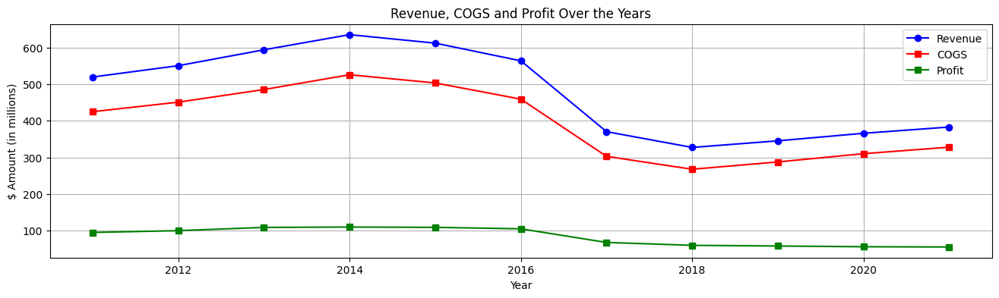

In [16]:
plt.figure(figsize=(16, 4))
plt.plot(data_year['Year'], data_year['Revenue'], marker='o', label='Revenue', color='blue')
plt.plot(data_year['Year'], data_year['COGS'], marker='s', label='COGS', color='red')
plt.plot(data_year['Year'], data_year['Profit'], marker='s', label='Profit', color='green')

# Thêm tiêu đề và nhãn
plt.title('Revenue, COGS and Profit Over the Years')
plt.xlabel('Year')
plt.ylabel('$ Amount (in millions)')
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()

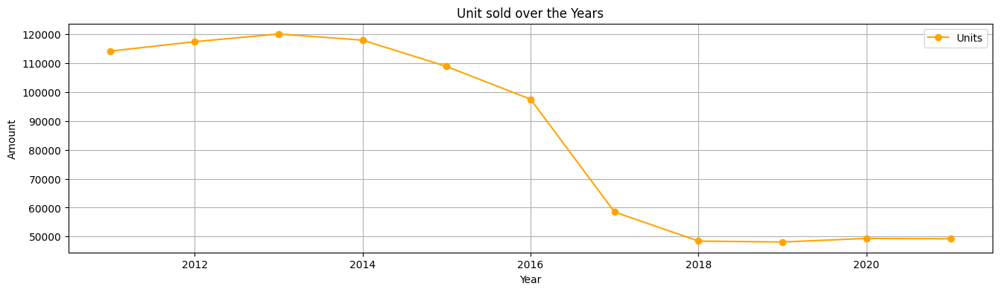

In [17]:
plt.figure(figsize=(16, 4))
plt.plot(data_year['Year'], data_year['Units'], marker='o', label='Units', color='orange')
plt.title('Unit sold over the Years')
# Thêm tiêu đề và nhãn
plt.xlabel('Year')
plt.ylabel('Amount')
plt.legend()
plt.grid(True)

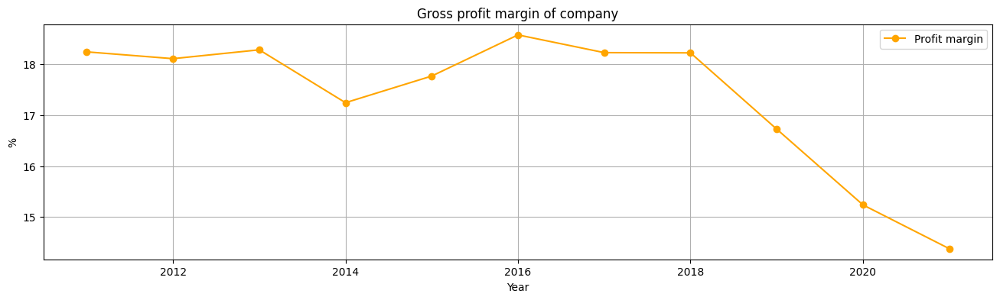

In [18]:
plt.figure(figsize=(16, 4))
plt.plot(data_year['Year'], data_year['total profit margin'], marker='o', label='Profit margin', color='orange')
plt.title('Gross profit margin of company')
# Thêm tiêu đề và nhãn
plt.xlabel('Year')
plt.ylabel('%')
plt.legend()
plt.grid(True)

__Biểu đồ giai đoạn 2010 - 2016 theo tháng của doanh nghiệp__

In [19]:
data['Month'] = data['Date'].dt.month

In [20]:
data_6_first = data[(data["Date"] >= "2010-01-01") & (data["Date"] <= "2016-12-31")]
data_6_first["Month"] = data_6_first["Date"].dt.to_period("M")
data_6_first = data_6_first.groupby("Month")[["Units",'Revenue','Profit']].sum().reset_index()
data_6_first[['Revenue','Profit']] = data_6_first[['Revenue','Profit']]/ (10**6)
data_6_first["Month"] = data_6_first["Month"].astype(str)
data_6_first["Month"] = pd.to_datetime(data_6_first["Month"])

C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\1443685745.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_first["Month"] = data_6_first["Date"].dt.to_period("M")


C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\239209685.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


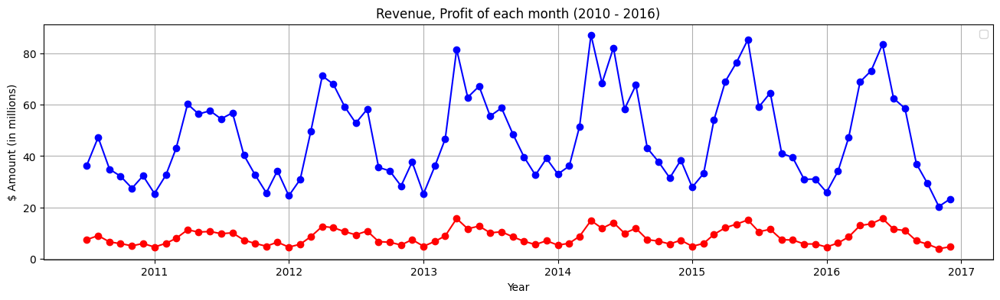

In [21]:
plt.figure(figsize=(16, 4))
plt.plot(data_6_first["Month"], data_6_first["Revenue"], marker="o", linestyle="-", color="b")
plt.plot(data_6_first["Month"], data_6_first["Profit"], marker="o", linestyle="-", color="r")

# Thêm tiêu đề và nhãn
plt.title('Revenue, Profit of each month (2010 - 2016)')
plt.xlabel('Year')
plt.ylabel('$ Amount (in millions)')
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()

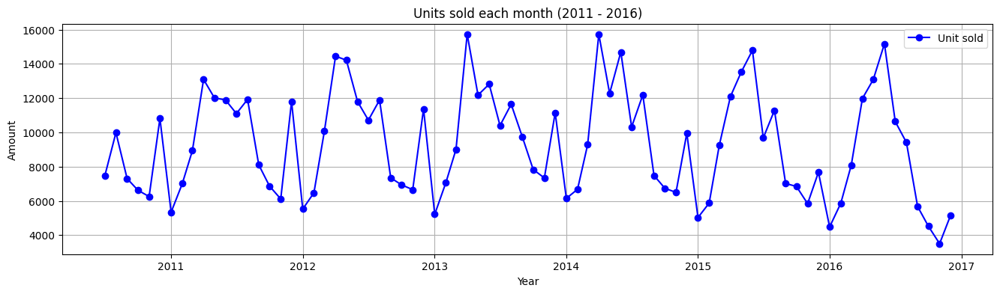

In [22]:
plt.figure(figsize=(16,4))
plt.plot(data_6_first['Month'], data_6_first["Units"], marker="o", linestyle="-", color="b", label="Unit sold")

# Thêm tiêu đề và nhãn
plt.title('Units sold each month (2011 - 2016)')
plt.xlabel('Year')
plt.ylabel('Amount')
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()

__Biểu đồ giai đoạn 2016 - 2022 của doanh nghiệp__

In [23]:
data_6_later = data[(data["Date"] >= "2016-01-01") & (data["Date"] <= "2022-06-30")]
data_6_later["Month"] = data_6_later["Date"].dt.to_period("M")
data_6_later = data_6_later.groupby("Month")[["Units",'Revenue','Profit']].sum().reset_index()
data_6_later[['Revenue','Profit']] = data_6_later[['Revenue','Profit']]/ (10**6)
data_6_later["Month"] = data_6_later["Month"].astype(str)
data_6_later["Month"] = pd.to_datetime(data_6_later["Month"])

C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\3138536944.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_later["Month"] = data_6_later["Date"].dt.to_period("M")


C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\4180838229.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


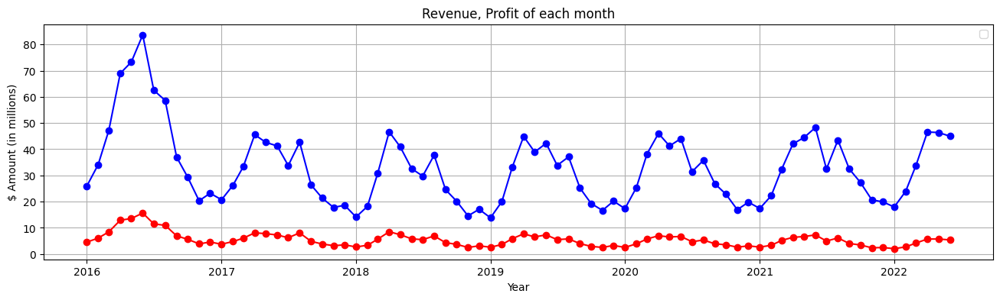

In [24]:
plt.figure(figsize=(16, 4))
plt.plot(data_6_later["Month"], data_6_later["Revenue"], marker="o", linestyle="-", color="b")
plt.plot(data_6_later["Month"], data_6_later["Profit"], marker="o", linestyle="-", color="r")

# Thêm tiêu đề và nhãn
plt.title('Revenue, Profit of each month')
plt.xlabel('Year')
plt.ylabel('$ Amount (in millions)')
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()

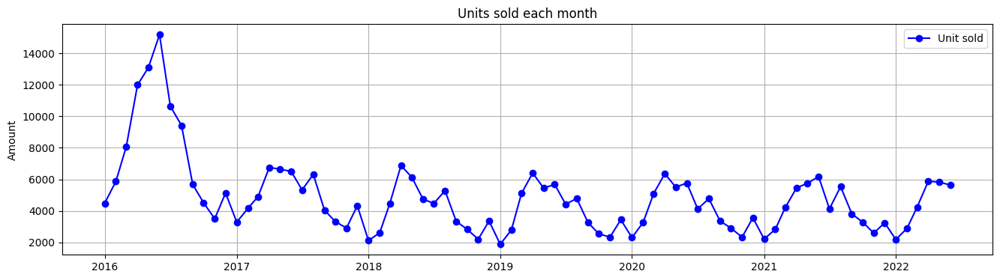

In [25]:
plt.figure(figsize=(16,4))
plt.plot(data_6_later['Month'], data_6_later["Units"], marker="o", linestyle="-", color="b", label="Unit sold")

# Thêm tiêu đề và nhãn
plt.title('Units sold each month')
plt.xlabel('')
plt.ylabel('Amount')
plt.legend()
plt.grid(True)

# Hiển thị biểu đồ
plt.show()

In [26]:
year_data = data[(data["Date"] >= "2011-01-01") & (data["Date"] <= "2021-12-31")]

__Thị phần về vị trí địa lý (Region ,Category, State, District)__

_Region_

In [27]:
region_year_data = year_data.groupby(['Year', 'Region'])[['Revenue', 'Profit', 'Units']].sum().reset_index()
region_year_data[['Revenue','Profit']] = region_year_data[['Revenue','Profit']]/ (10**6)
region_year_data['Profit Margin'] = region_year_data['Profit']/region_year_data['Revenue']* 100

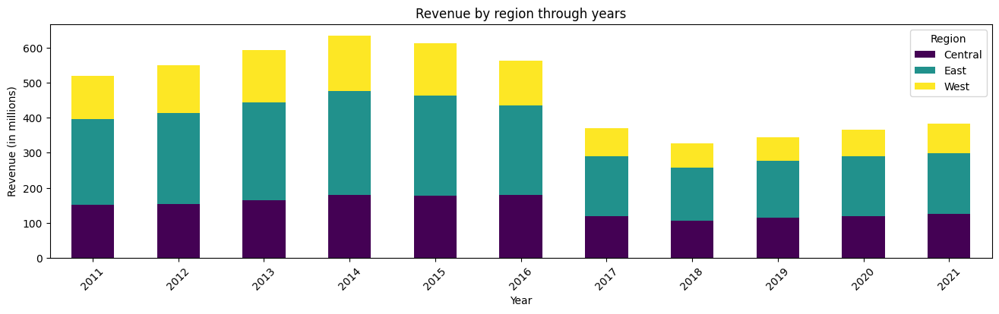

In [28]:
region_data_rev = region_year_data.pivot_table(values='Revenue', index='Year', columns='Region', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
region_data_rev.plot(kind='bar', stacked=True, figsize=(16, 4), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Revenue (in millions)')
plt.title('Revenue by region through years')
plt.legend(title='Region')
plt.xticks(rotation=45)
plt.show()

In [29]:
# Revenue East cao nhat, xap xi 47%, sau do den Central xap xi 28-30%, con lai la West

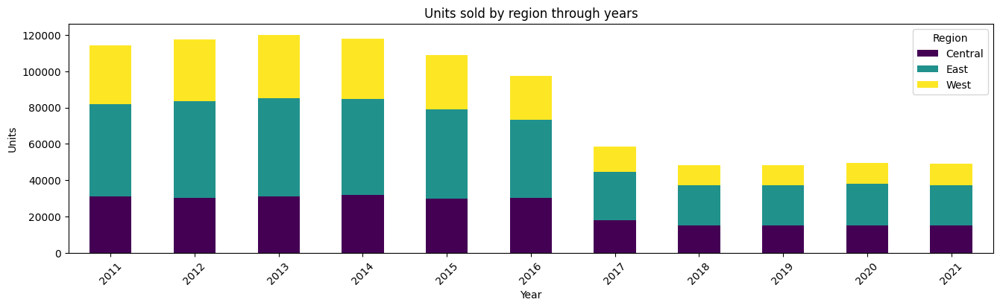

In [30]:
region_data_unit = year_data.pivot_table(values='Units', index='Year', columns='Region', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
region_data_unit.plot(kind='bar', stacked=True, figsize=(16, 4), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Units')
plt.title('Units sold by region through years')
plt.legend(title='Region')
plt.xticks(rotation=45)
plt.show()

In [31]:
# Units East co so luong ban cao nhat, units cua west co xu huong giam trong 10 nam vua qua, trong khi do units cua central
# co xu huong tang len, khien cho ty trong units cua west 5 nam dau > cua central, 5 nam sau thi nho hon

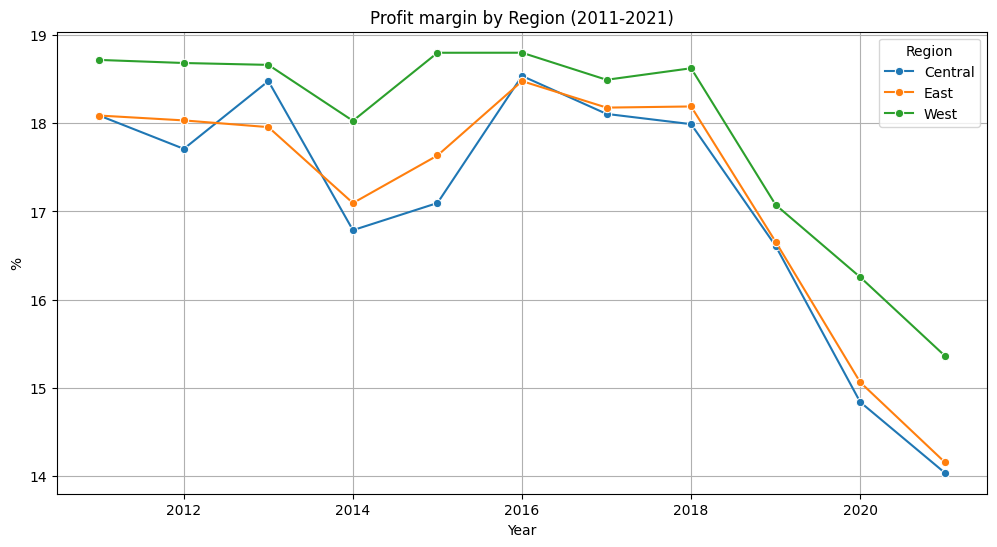

In [32]:
# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
snb.lineplot(data = region_year_data, x="Year", y="Profit Margin", hue="Region", marker="o")

# Tùy chỉnh biểu đồ
plt.title("Profit margin by Region (2011-2021)")
plt.xlabel("Year")
plt.ylabel("%")
plt.legend(title="Region")
plt.grid(True)
plt.show()

_Category_

In [33]:
category_year_data = year_data.groupby(['Year', 'Category'])[['Revenue', 'Profit', 'Units']].sum().reset_index()
category_year_data[['Revenue','Profit']] = category_year_data[['Revenue','Profit']]/ (10**6)
category_year_data['Profit Margin'] = category_year_data['Profit']/category_year_data['Revenue']* 100

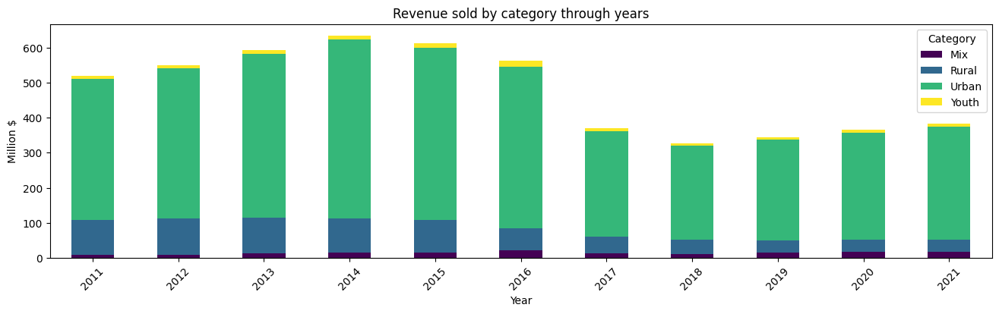

In [34]:
category_data = category_year_data.pivot_table(values='Revenue', index='Year', columns='Category', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
category_data.plot(kind='bar', stacked=True, figsize=(16, 4), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Million $')
plt.title('Revenue sold by category through years')
plt.legend(title='Category')
plt.xticks(rotation=45)
plt.show()

In [35]:
# Units cua Rural cao, nhung revenue lai k duoc nhu the.Phan lon revenue la den tu vung rural va urban, nam 2011 units 2 vung nay xap xi nhau, nhung 
# revenue lai co khoang cach lon khi  revenue o urban chiem 77,6%, unts chi chiem 19,3% va co cau nay thay doi giong voi co cau cua units, trong nam 2021,
# rev cua urban chiem~85%, trong khi do rural chi 8.3%

# Do chenh lech thu nhap kha dung cua 2 vung ngay cang lon  


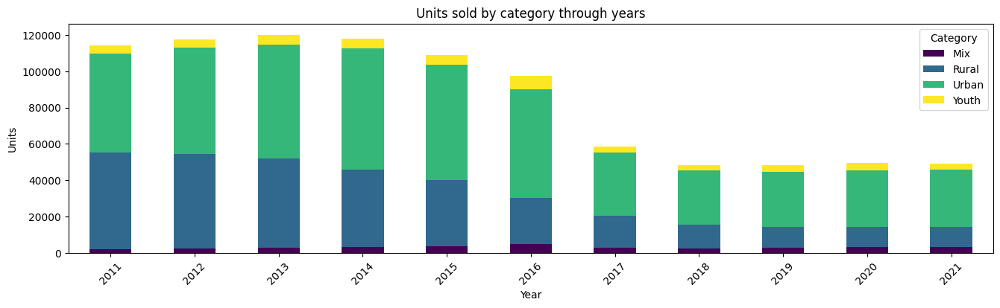

In [36]:
category_data = category_year_data.pivot_table(values='Units', index='Year', columns='Category', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
category_data.plot(kind='bar', stacked=True, figsize=(16, 4), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Units')
plt.title('Units sold by category through years')
plt.legend(title='Category')
plt.xticks(rotation=45)
plt.show()

In [37]:
# 2 khu vuc chinh la rural va urban. 2011, units cua rural va urban xap xi bang nhau~47%. Tuy nhien qua cac nam, ty le co cau units cua urban cang tang, trong khi do co
# cau cua rural ngay cang giam. Tu 2013, units cua urban chiem hon 50%, sau do tang dan den ~65% 2-21, trong khi do den nam 2022 ty le cua rural chi con
# 22% nam 2021


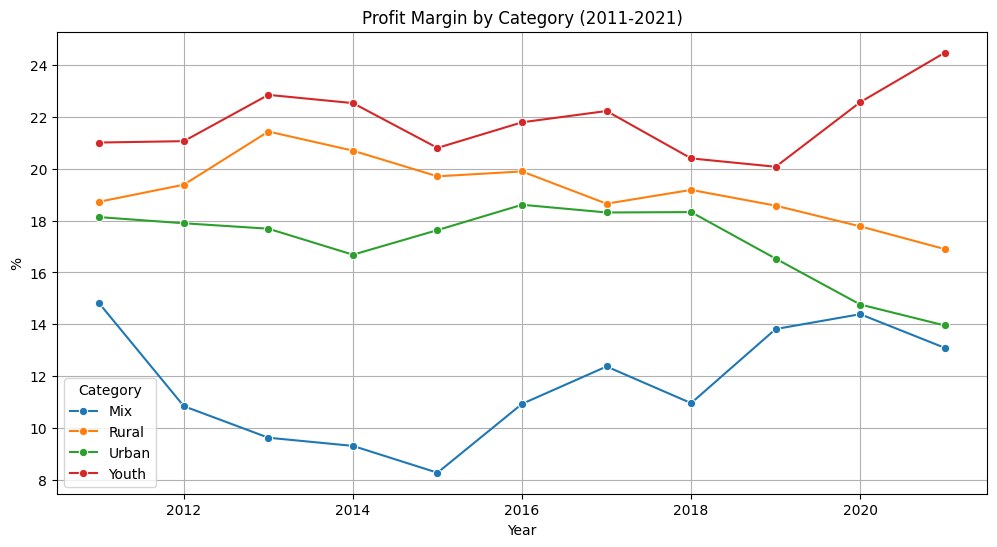

In [38]:
# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
snb.lineplot(data = category_year_data, x="Year", y="Profit Margin", hue="Category", marker="o")

# Tùy chỉnh biểu đồ
plt.title("Profit Margin by Category (2011-2021)")
plt.xlabel("Year")
plt.ylabel("%")
plt.legend(title="Category")
plt.grid(True)
plt.show()

_State = DIstrict_

In [39]:
state = year_data['State'].unique()
y_average_revenue = [year_data[year_data['State']==i]['Revenue'].sum()/12for i in state]
y_average_units = [year_data[year_data['State']==i]['Units'].sum()/12for i in state]
state_average_data = pd.DataFrame({'State':state,'Revenue':y_average_revenue,'Units':y_average_units})

<>:2: SyntaxWarning: invalid decimal literal
<>:3: SyntaxWarning: invalid decimal literal
<>:2: SyntaxWarning: invalid decimal literal
<>:3: SyntaxWarning: invalid decimal literal
C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\3482186804.py:2: SyntaxWarning: invalid decimal literal
  y_average_revenue = [year_data[year_data['State']==i]['Revenue'].sum()/12for i in state]
C:\Users\Pham Hong Phuc\AppData\Local\Temp\ipykernel_18344\3482186804.py:3: SyntaxWarning: invalid decimal literal
  y_average_units = [year_data[year_data['State']==i]['Units'].sum()/12for i in state]


In [40]:
state_average_data['Full Name'] = ['Texas','California','Ohio','Georgia','North Carolina','Florida','Wisconsin',
                                    'New Jersey','Colorado','Nevada','New York','Tennessee','Minnesota','Delaware',
                                    'Michigan','Indiana','Arizona','Pennsylvania','South Dakota','Idaho','Illinois',
                                    'Virginia','Missisippi','Washington','District of Columbia','Oregon','Alabama','Louisiana',
                                    'Missouri','South Carolina','Alaska','Iowa','Kentucky','Kansas','Nebraska',
                                    'Rhode Island','Arkansas','Massachusetts','Utah','Maryland','Oklahoma','Connecticut',
                                    'West Virginia','Montana','Wyoming','New Mexico','North Dakota','Vermont','New Hampshire']

In [41]:
state_average_data['Revenue Quintile'] = pd.qcut(state_average_data['Revenue'], q=5, labels=['0-20%','20-40%','40-60%','60-80%','80-100%'], duplicates='drop')
# Create the choropleth map
fig = px.choropleth(
    state_average_data,
    locations="State",  # Column with state abbreviations
    locationmode="USA-states",       # Set to US states
    color="Revenue Quintile",        # Column to determine color (quantiles)
    scope="usa",                     # Limit map to USA
    color_continuous_scale="Viridis", # Color scale
    title="Average revenue by State in the US (Quintiles)",
    labels={"Revenue Quintile": "Revenue Quintiles"}
)

# Add state abbreviations as labels
fig.update_layout(
    geo=dict(
        lakecolor='rgb(200, 200, 200)',
    ),
    annotations=[
        dict(
            x=0.5,
            y=-0.5,
            xref='paper',
            yref='paper',
            text = 'Revenue quantiles',
            showarrow=False
        )
    ]
)
# Show the map
fig.show()

In [42]:
state_average_data['Units Quintile'] = pd.qcut(state_average_data['Units'], q=5, labels=['0-20%','20-40%','40-60%','60-80%','80-100%'], duplicates='drop')
# Create the choropleth map
fig = px.choropleth(
    state_average_data,
    locations="State",  # Column with state abbreviations
    locationmode="USA-states",       # Set to US states
    color="Units Quintile",        # Column to determine color (quantiles)
    scope="usa",                     # Limit map to USA
    color_continuous_scale="Viridis", # Color scale
    title="Average Units by State in the US (Quintiles)",
    labels={"Units Quintile": "Units Quintile"}
)

# Add state abbreviations as labels
fig.update_layout(
    geo=dict(
        lakecolor='rgb(255, 255, 255)',
    ),
    annotations=[
        dict(
            x=0.5,
            y=-0.5,
            xref='paper',
            yref='paper',
            text = 'Units quintiles',
            showarrow=False
        )
    ]
)
# Show the map
fig.show()

In [43]:
# Khong co dao Hawaii va bang Maine
#dung dau la cac bang lon, co GDP cao nhu bang California, Texas, Florida, trong khi do, cac bang phat trien chua bang, co GDP thap nhu #new hamsphire va vermont thi dung 

__Thị phần các dòng sản phẩm (Segment, Product Lines)__

_Segment_

In [44]:
segment_data = year_data.groupby(['Year', 'Segment'])[['Revenue', 'Units','Profit']].sum().reset_index()
segment_data[['Revenue','Profit']] = segment_data[['Revenue','Profit']]/ (10**6)
segment_data['Profit Margin'] = segment_data['Profit']/segment_data['Revenue']* 100

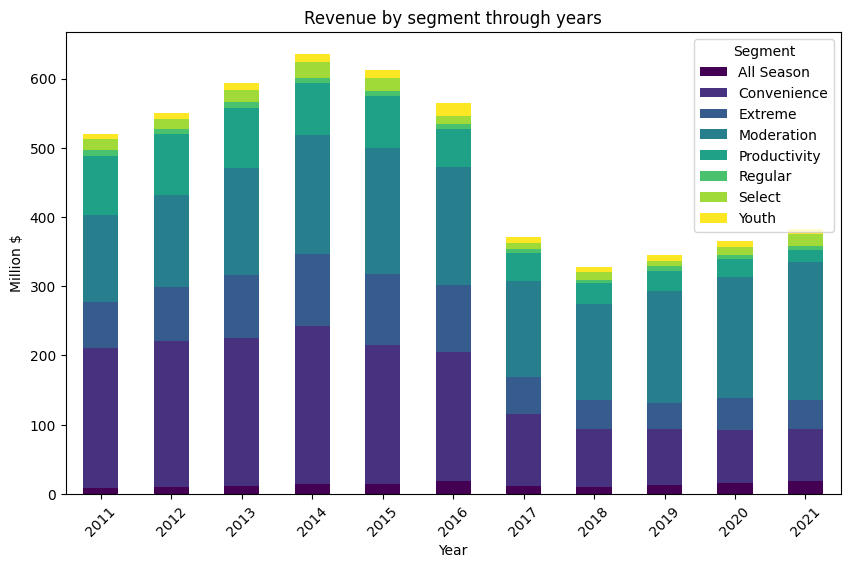

In [45]:
segment_data_rev = segment_data.pivot_table(values='Revenue', index='Year', columns='Segment', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
segment_data_rev.plot(kind='bar', stacked=True, figsize=(10,6), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Million $')
plt.title('Revenue by segment through years')
plt.legend(title='Segment')
plt.xticks(rotation=45)
plt.show()

In [46]:
#ty trong hang Convenice, Productivity, Moderation chiem phan lon doanh thu ~ 92% , trong do nhung nam 2011, 2012, Convenience dan
# dau voi 37%-~38%, sau do den Moderation voi 25-26%, Productivity chiem khoang 16%. Tuy nhien, qua tung nam, thi phan cua Convenience va Productivty 
# cang giam, ty trong mat hang Moderation ngay cang tang. Tu nam 2017, Moderation chiem ty trọng lon nhat ~ 37%. Va den nam 2021, Modration chiem khoang
# 52%, tiep sau laConvienience gio chi chiem khoang 21%, Productivity chiem 4-5%

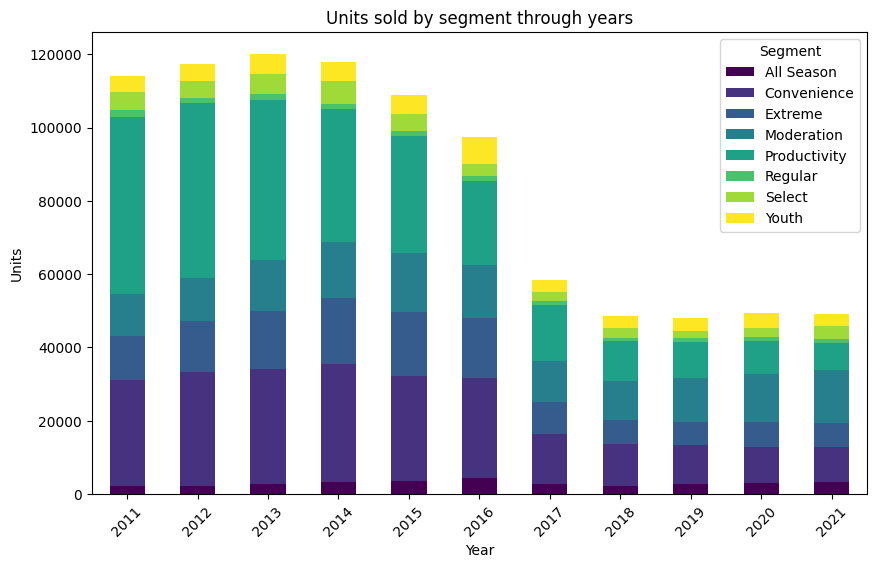

In [47]:
segment_data_unit = segment_data.pivot_table(values='Units', index='Year', columns='Segment', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
segment_data_unit.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Units')
plt.title('Units sold by segment through years')
plt.legend(title='Segment')
plt.xticks(rotation=45)
plt.show()

In [48]:
# xu huong tuong tu voi Revenue

_Product Lines_

In [49]:
data['Product Lines'] = data['Product'].apply(lambda x: x.split()[0])

In [50]:
product_lines_data = year_data.groupby(['Year', 'Product Lines'])[['Revenue', 'Profit', 'Units']].sum().reset_index()
product_lines_data[['Revenue','Profit']] = product_lines_data[['Revenue','Profit']]/ (10**6)
product_lines_data['Profit Margin'] = product_lines_data['Profit']/product_lines_data['Revenue']* 100

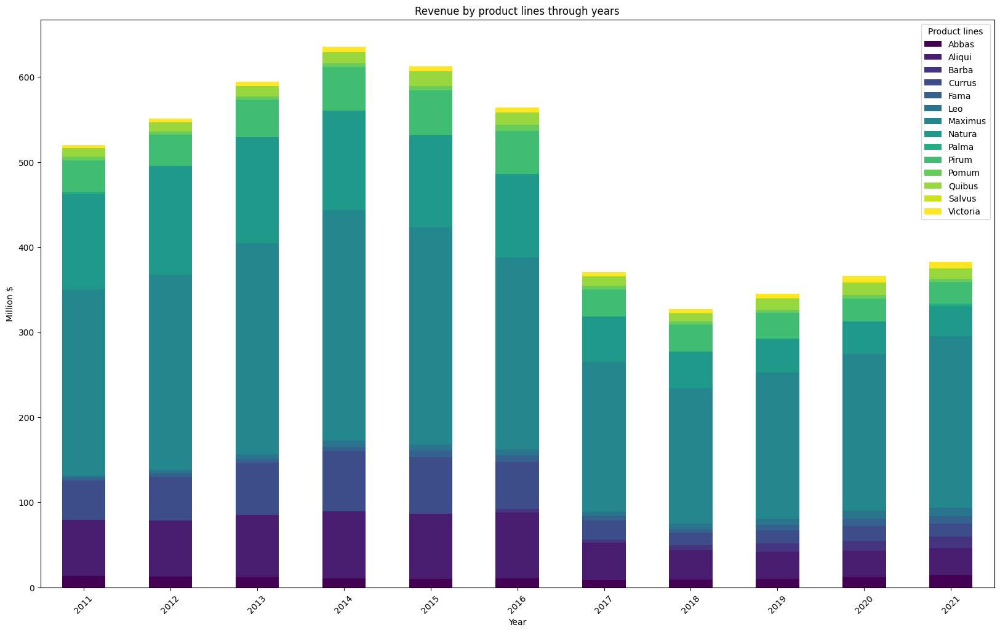

In [96]:
product_lines_data_rev = product_lines_data.pivot_table(values='Revenue', index='Year', columns='Product Lines', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
product_lines_data_rev.plot(kind='bar', stacked=True, figsize=(20, 12), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Million $')
plt.title('Revenue by product lines through years')
plt.legend(title='Product lines')
plt.xticks(rotation=45)
plt.show()

In [52]:
# Pirum, Natura, Maximus, Aliqui, Currus là  mặt hàng chiếm tỷ trọng lớn nhất trong units, tổng khoảng 92 - 93%
# Maximus luôn có tỷ trọng lớn nhất và tỷ trọng có xu hướng tăng dần theo tgian (42% -2011 tới 50% 2021)
# Palma với tỷ trọng rất bé năm 2011 - 0.6%, không còn bán ở Năm 2012 và trở lại vào năm 2021, cũng với tỷ lệ rất bé ~ 0.6%
# Salvus xuat hiện năm 2017
# Barba xuất hiện năm 2016 và có đà tăng trưởng doanh thu ấn tượng khi tăng qua các năm. 0.8% năm 2016 đến 3.6% năm 2021
# Natura có tỷ trọng giảm theo từng năm, từ 21.5% năm 2011 chỉ còn 9.2# năm 
#Cirus giảm sốc năm 2017

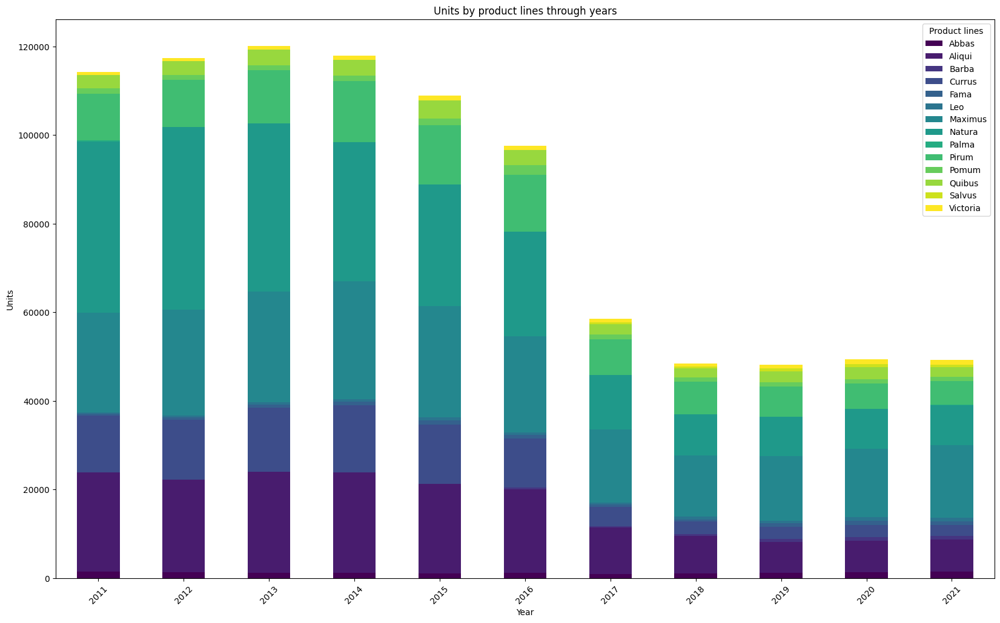

In [95]:
product_lines_data_units = product_lines_data.pivot_table(values='Units', index='Year', columns='Product Lines', aggfunc='sum', fill_value=0)
# Vẽ biểu đồ cột stacked
product_lines_data_units.plot(kind='bar', stacked=True, figsize=(20, 12), colormap='viridis')
plt.xlabel('Year')
plt.ylabel('Units')
plt.title('Units by product lines through years')
plt.legend(title='Product lines')
plt.xticks(rotation=45)
plt.show()

In [54]:
# Pirum, Natura, Maximus, Aliqui là 4 mặt hàng chiếm tỷ trọng lớn nhất trong units, tổng khoảng 92 - 93%
# Natura những năm đầu có tỷ trọng lớn nhất, tuy nhiên có xu hướng giảm theo tgian (33.9% - 2011 còn 18% )
# Maximus có tỷ trọng units  theo từng năm, từ 19.% năm 2011 lên 28% năm 2017, đưa Natura về vị trí top 2(21.2%)
# Palma với tỷ trọng rất bé năm 2010, 2011 và không còn bán ở Năm 2012, tuy  trở lại vào năm 2021, cũng với tỷ lệ rất bé ~ 1%
# Salvus xuat hiện năm 2017
# Barba xuất hiện năm 2016 và có đà tăng trưởng doanh thu tăng qua các năm. 0.% năm 2016 đến 31.% năm 2021
#Cirus giảm sốc năm 2017

Tỷ lệ revenue, profit của maximus luôn lớn nhất, luôn áp đảo với 43 - 50%
Natura rev, profit ngày xưa ở rank 2 vói 23.1%, nhưng tụt dần qua từng năm, 8.7% vào 2021, trong khi unit lại đứng top 1 và cũng giảm dần qua
    từng năm 36.9% xuống 17,8. Từ năm 2016, thì unit của maximus lại đứng top 1, tăng trưởng trong doanh số bán hàng liên tục từ 18.3 - 32.7%
Palma tồn tại được 2 năm 2010 và 2011, sau đó biến mất, và được bán trở lại vào năm 2021
BarBa ra đời năm 2016, và có tiềm năng tăng trưởng lớn khi doanh thu có cơ cấu trong tổng doanh thu tăng hàng tháng, cơ cấu lợi nhuận trong tổng 
    lợi nhuận cũng có xu hướng tăng dù đang chưa nhiều, ~~3%
Salvus ra đời năm 2017, nhưng k quá ấn tượng khi cả doanh thu, lợi nhuận đóng góp trên tổng doanh thu, lợi nhuận luôn <1%
Currus bị giảm mạnh về cơ cấu doanh số, từ 12,9% ở 2014, giảm dần ở các năm tiếp theo ,5 năm gần đây chỉ còn 5.5 - 5.8% ,điều tương tự với cơ cấu 
    lợi nhuận khi 19.3% ở 2014 về 5-6% trong 5 năm gần đay (check lại)

Cứ ngày 30/1 thì tăng mạnh, 31/1 lại giảm xuống

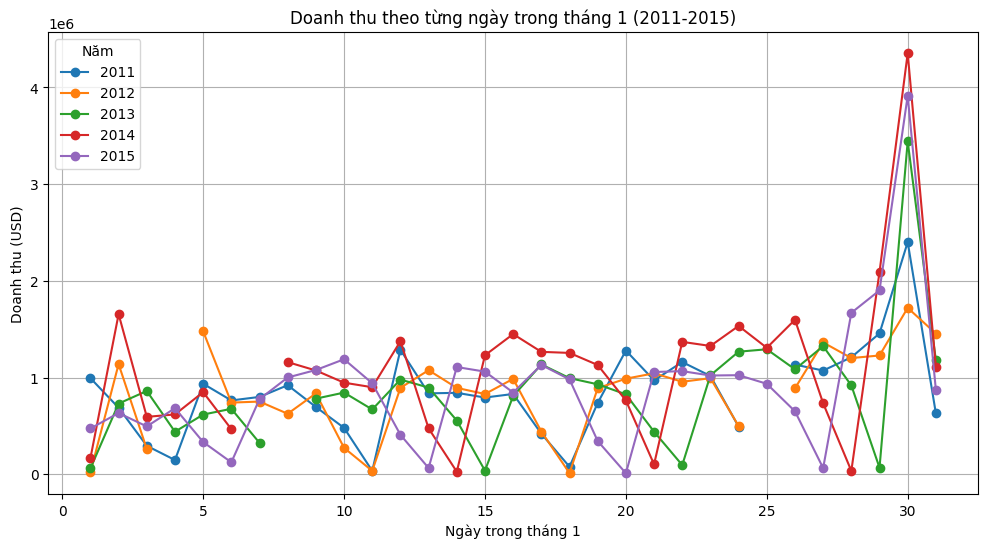

In [55]:
data_jan = data[(data["Date"].dt.month == 1) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 1")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 1 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

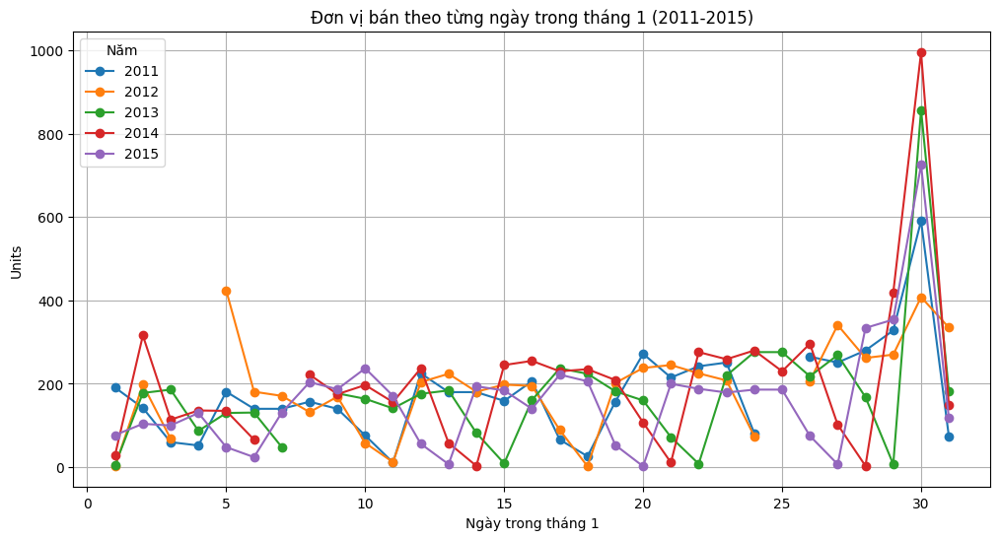

In [80]:
data_jan = data[(data["Date"].dt.month == 1) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 1")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 1 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

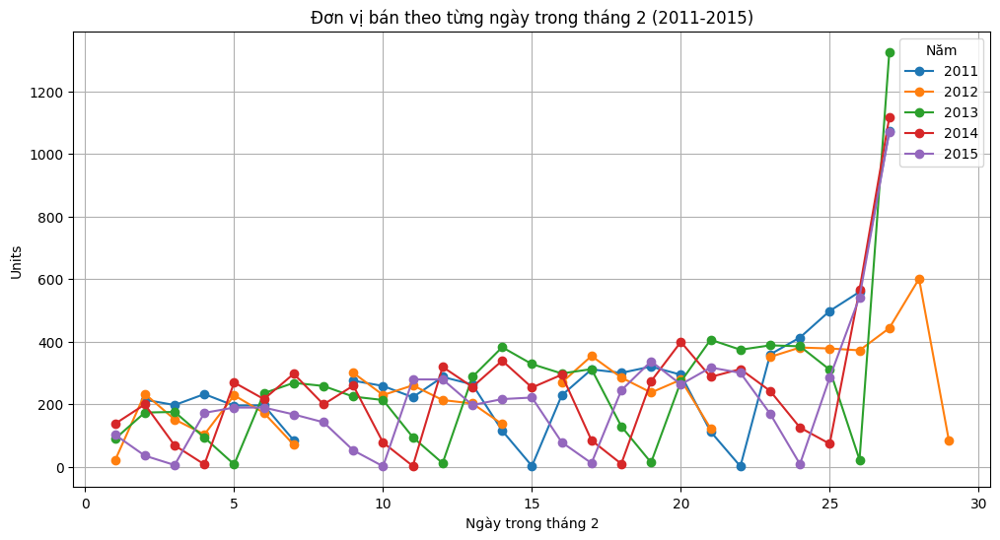

In [81]:
data_jan = data[(data["Date"].dt.month == 2) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 2")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 2 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

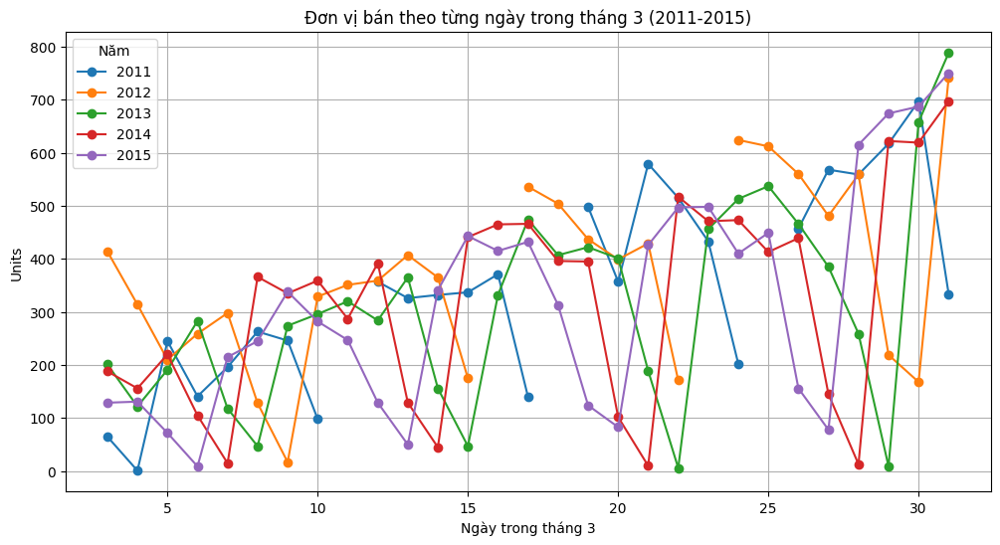

In [82]:
data_jan = data[(data["Date"].dt.month == 3) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 3")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 3 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

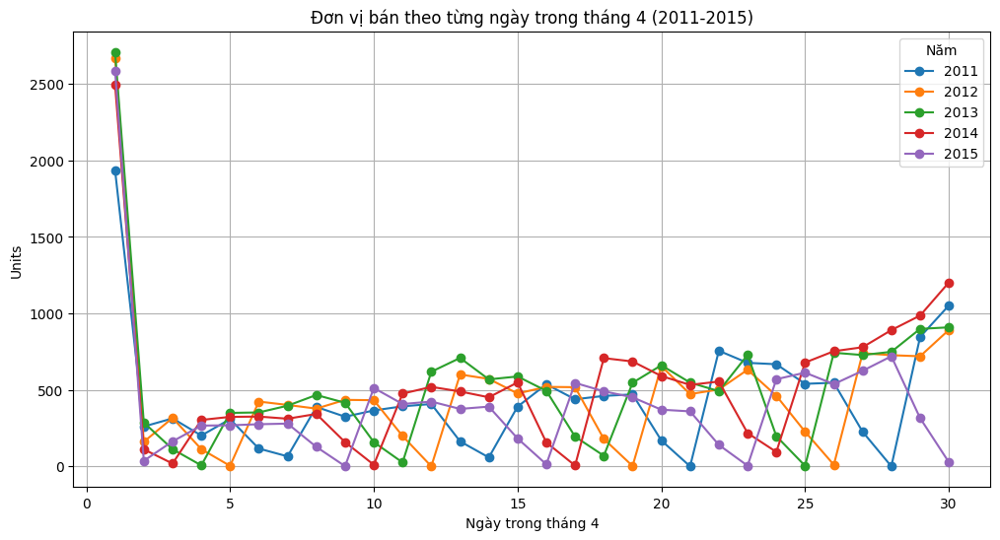

In [83]:
data_jan = data[(data["Date"].dt.month == 4) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 4")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 4 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

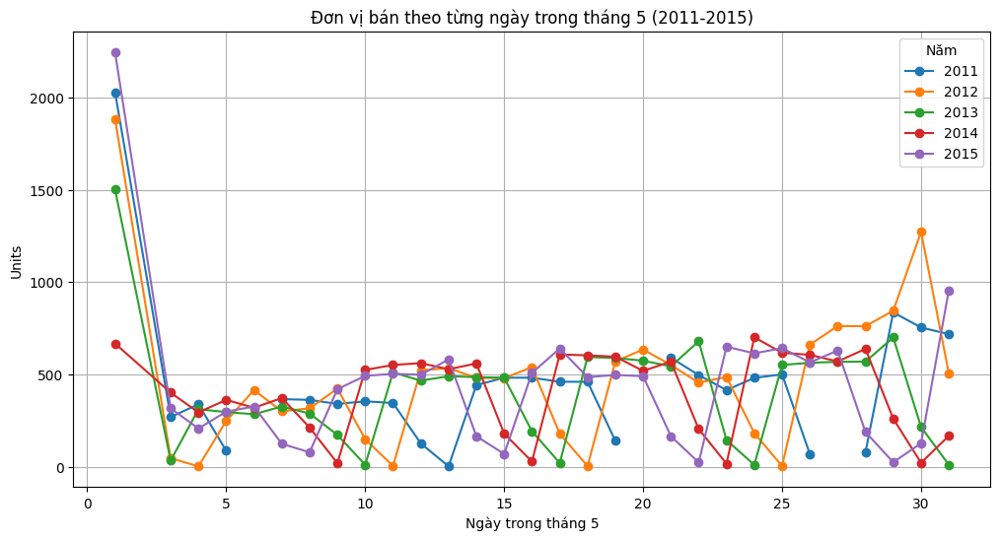

In [84]:
data_jan = data[(data["Date"].dt.month == 5) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 5")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 5 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

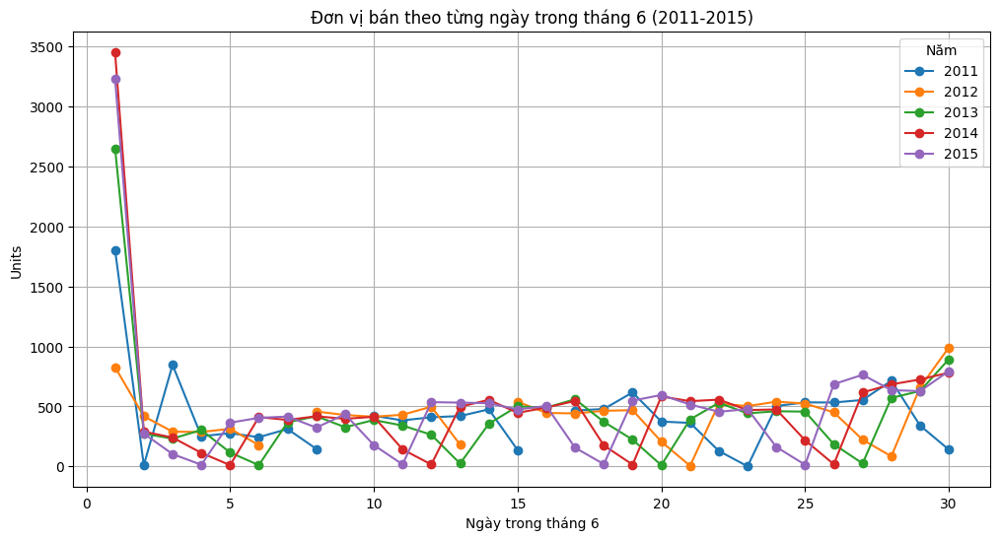

In [85]:
data_jan = data[(data["Date"].dt.month == 6) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 6")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 6 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

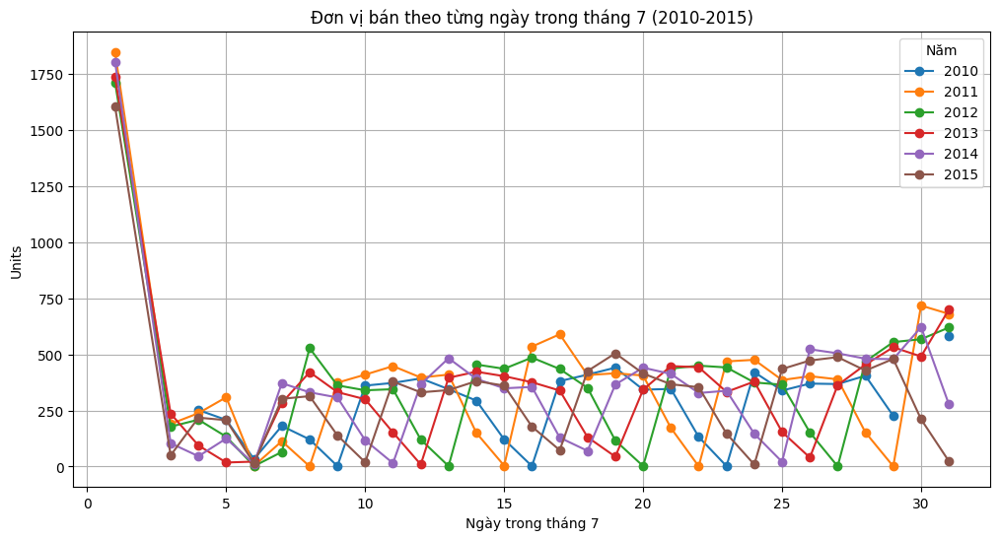

In [91]:
data_jan = data[(data["Date"].dt.month == 7) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 7")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 7 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

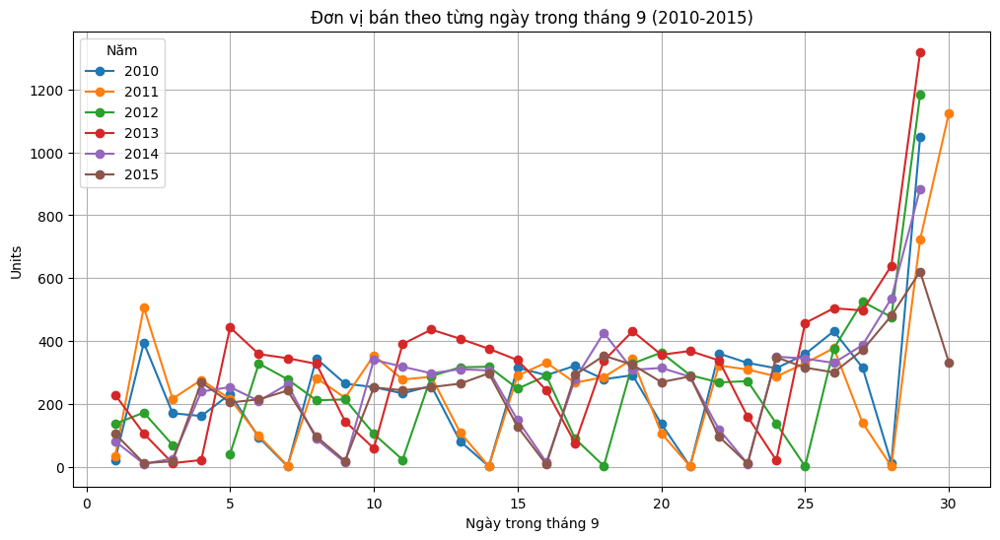

In [90]:
data_jan = data[(data["Date"].dt.month == 9) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 9")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 9 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

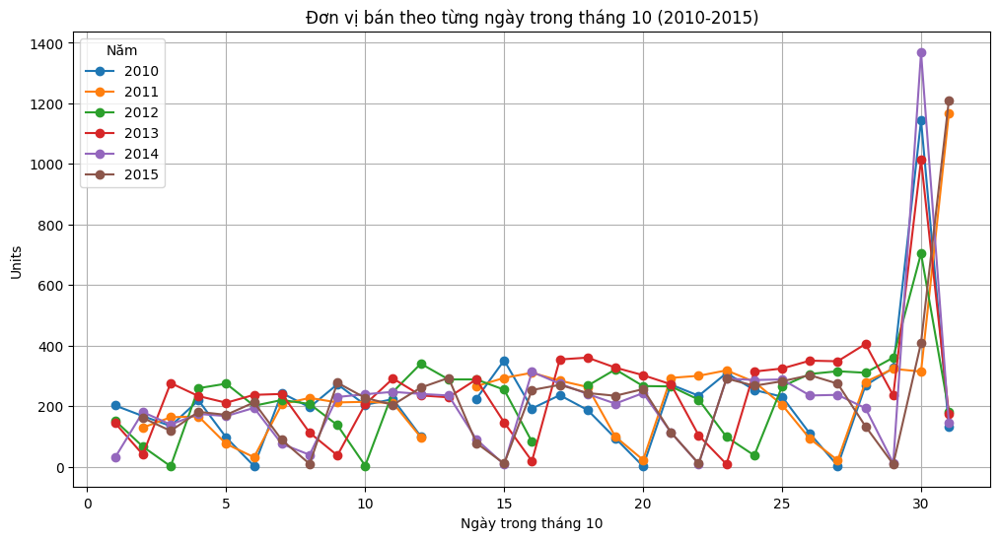

In [92]:
data_jan = data[(data["Date"].dt.month == 10) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 10")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 10 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

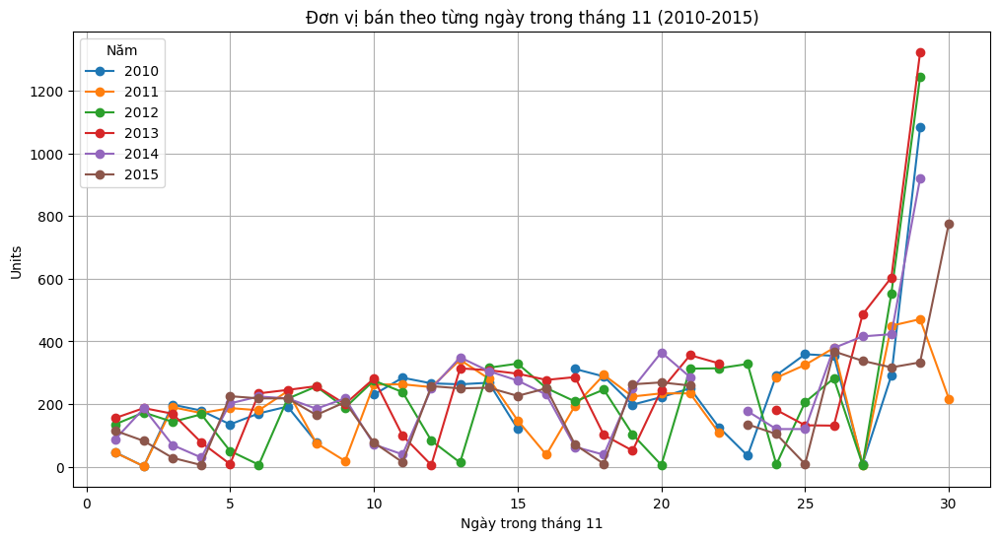

In [93]:
data_jan = data[(data["Date"].dt.month == 11) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 11")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 11 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

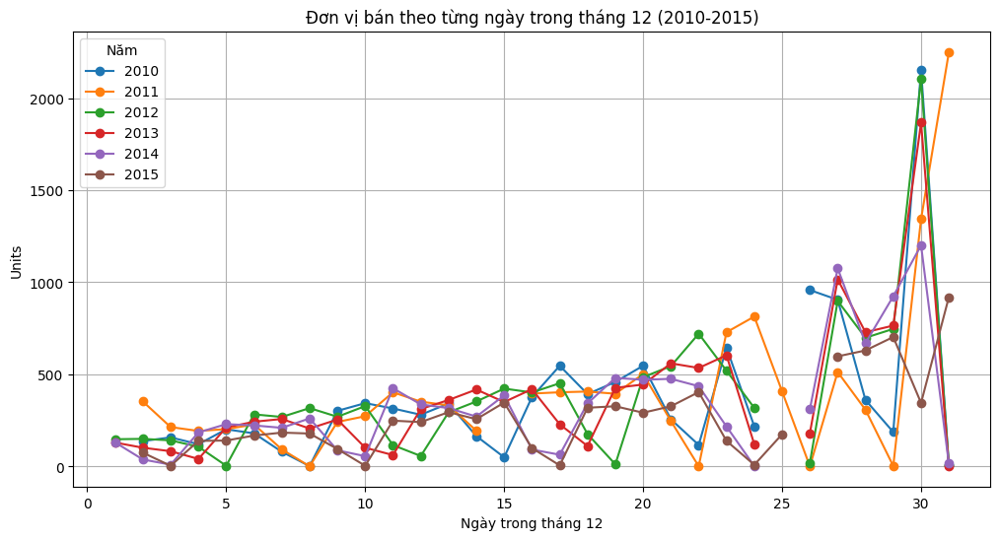

In [94]:
data_jan = data[(data["Date"].dt.month == 12) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 12")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 12 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

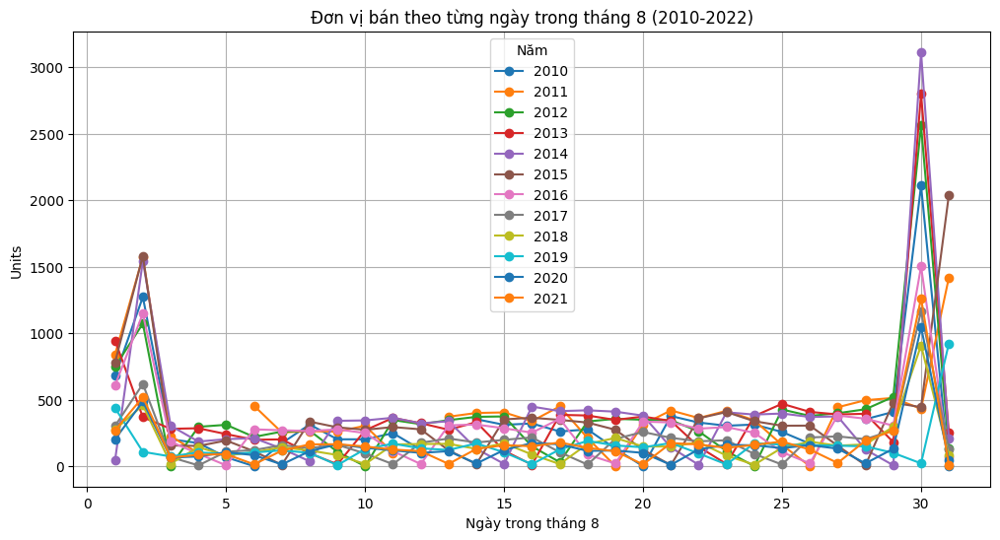

In [88]:
data_jan = data[(data["Date"].dt.month == 8) & (data["Date"].dt.year.isin([2010, 2011, 2012, 2013, 2014,2015,2016,2017,2018,2019,2020,2021]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Units"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010, 2011, 2012, 2013, 2014,2015,2016,2017,2018,2019,2020,2021]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 8")
plt.ylabel("Units")
plt.title("Đơn vị bán theo từng ngày trong tháng 8 (2010-2022)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

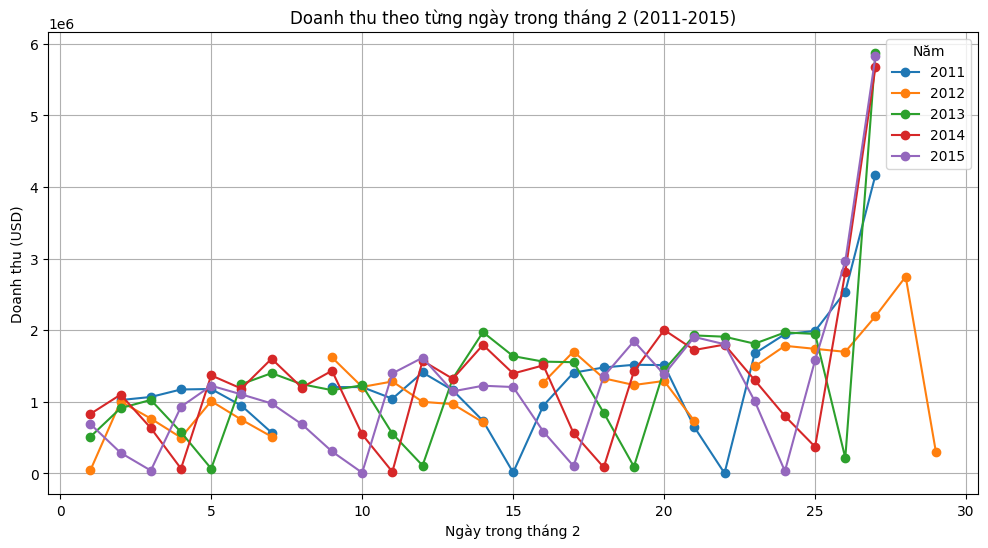

In [56]:
data_jan = data[(data["Date"].dt.month == 2) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 2")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 2 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

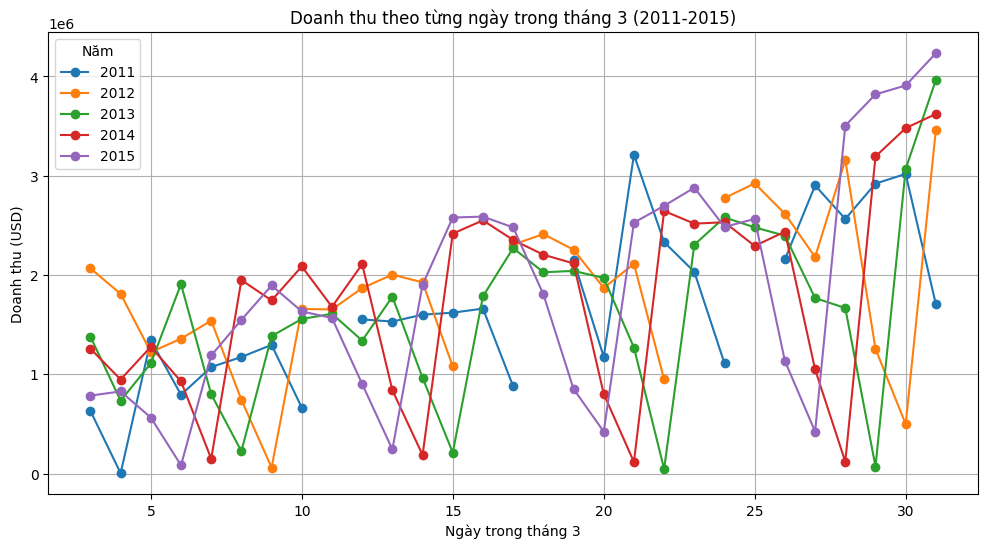

In [57]:
data_jan = data[(data["Date"].dt.month == 3) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 3")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 3 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

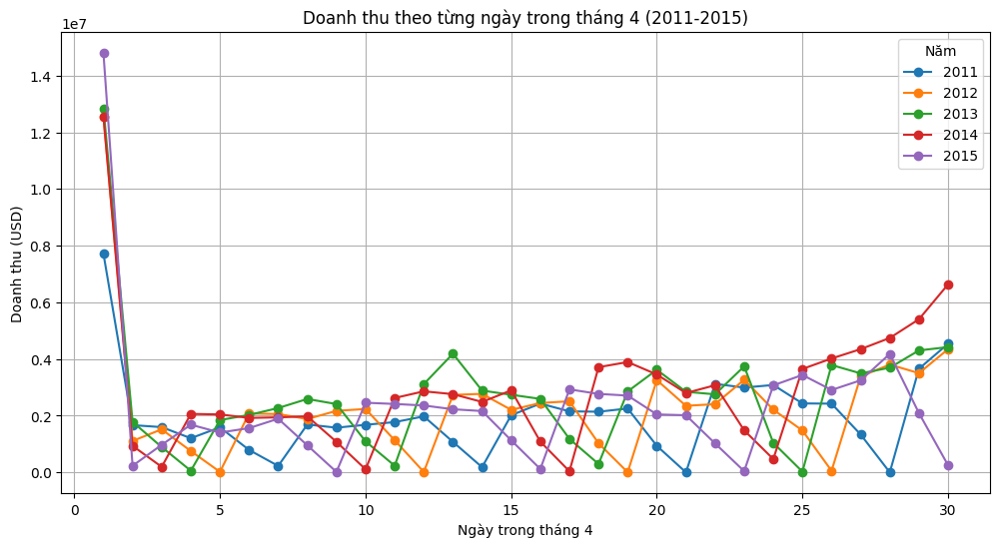

In [58]:
data_jan = data[(data["Date"].dt.month == 4) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 4")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 4 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

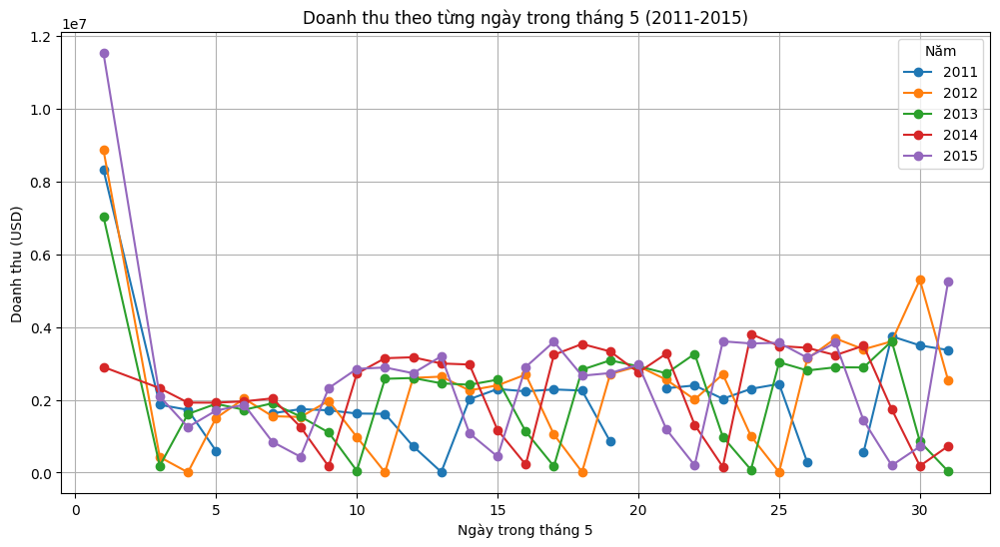

In [59]:
data_jan = data[(data["Date"].dt.month == 5) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 5")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 5 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

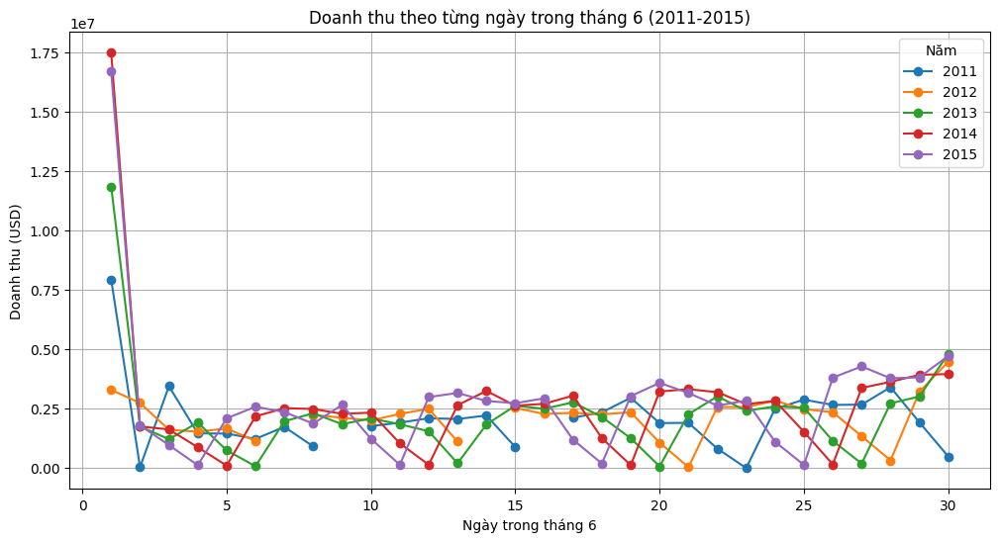

In [60]:
data_jan = data[(data["Date"].dt.month == 6) & (data["Date"].dt.year.isin([2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 6")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 6 (2011-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

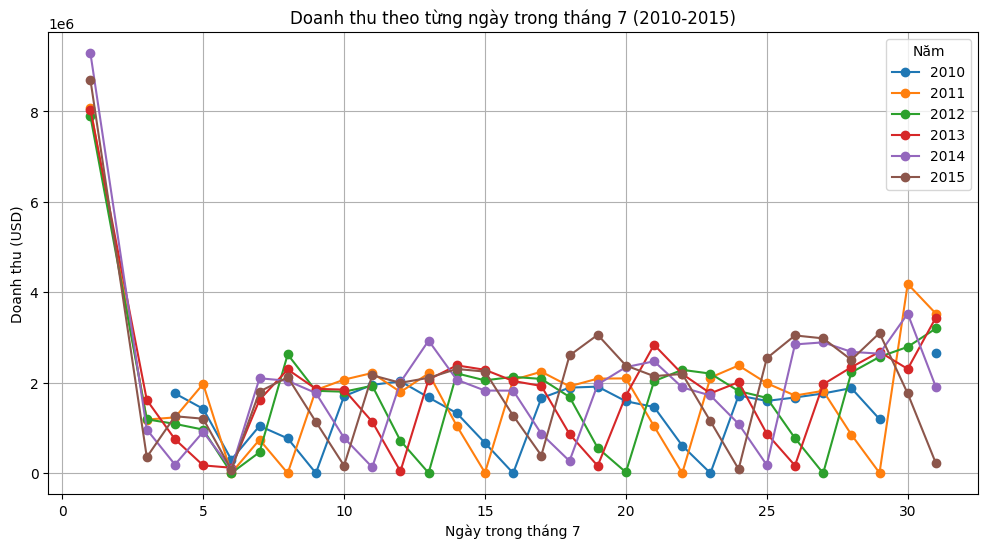

In [61]:
data_jan = data[(data["Date"].dt.month == 7) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 7")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 7 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

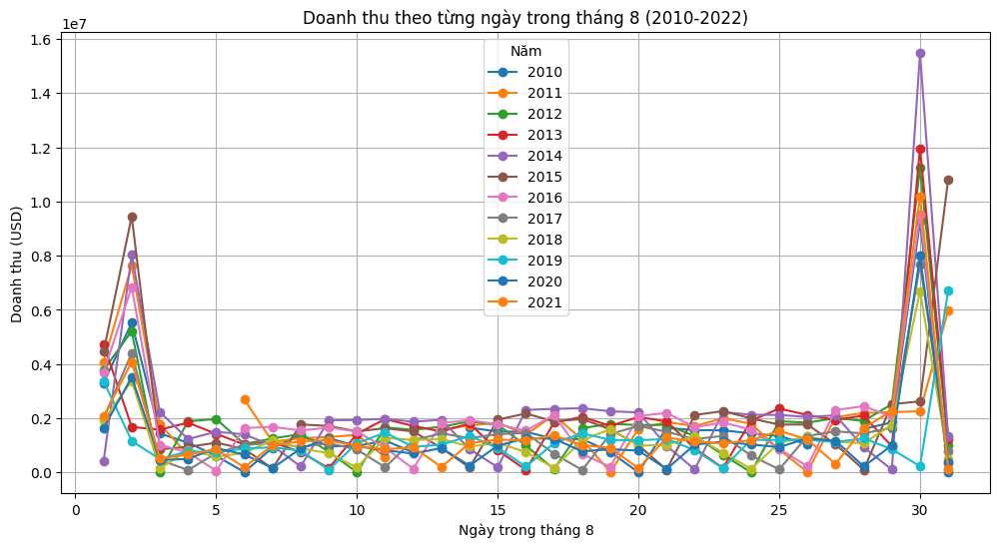

In [62]:
data_jan = data[(data["Date"].dt.month == 8) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015,2015,2016,2017,2018,2019,2020,2021,2022]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015,2016,2017,2018,2019,2020,2021,2022]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 8")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 8 (2010-2022)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

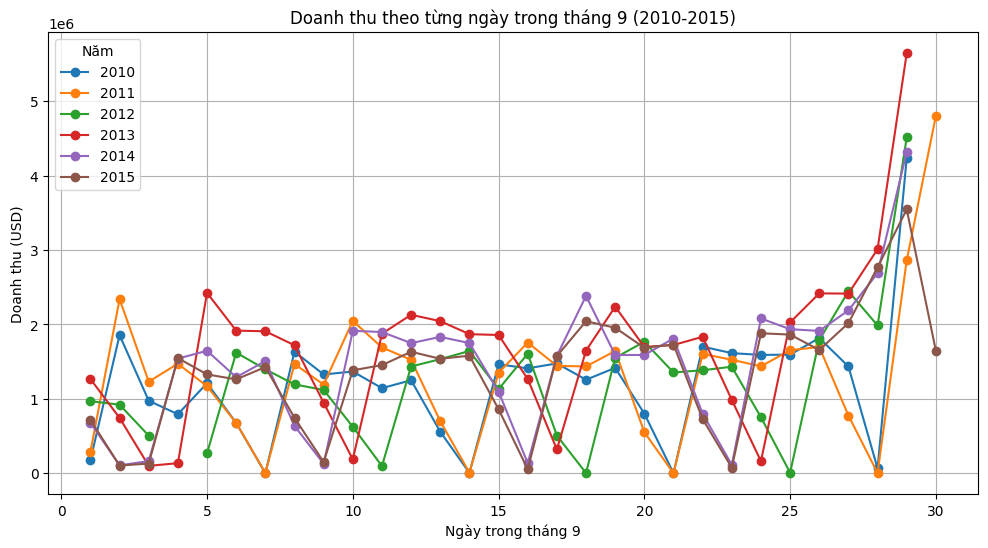

In [63]:
data_jan = data[(data["Date"].dt.month == 9) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 9")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 9 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

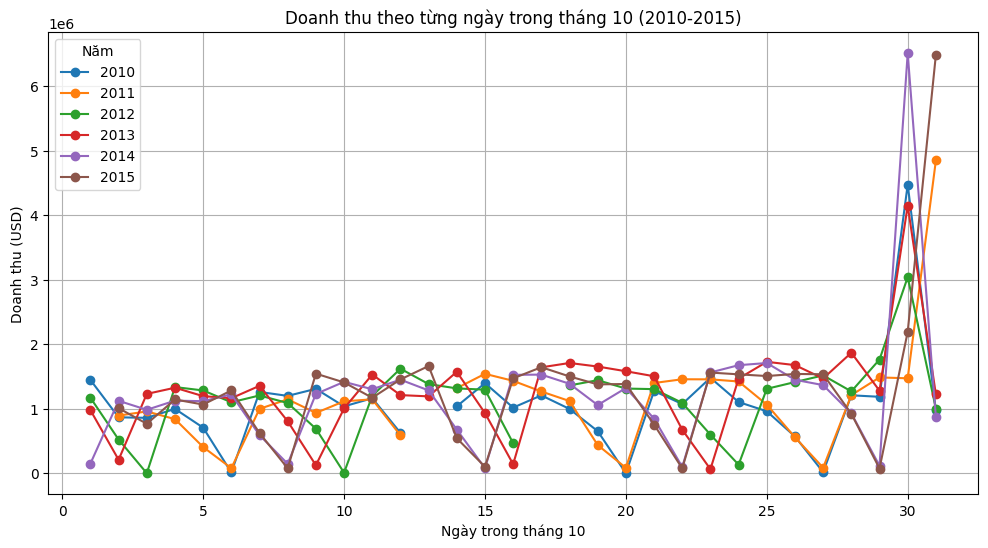

In [64]:
data_jan = data[(data["Date"].dt.month == 10) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 10")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 10 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

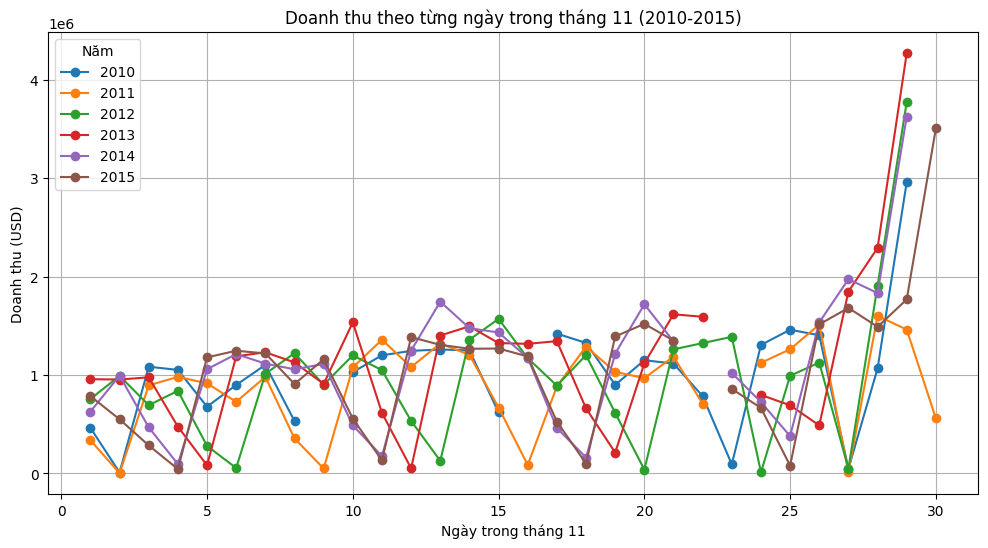

In [65]:
data_jan = data[(data["Date"].dt.month == 11) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 11")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 11 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

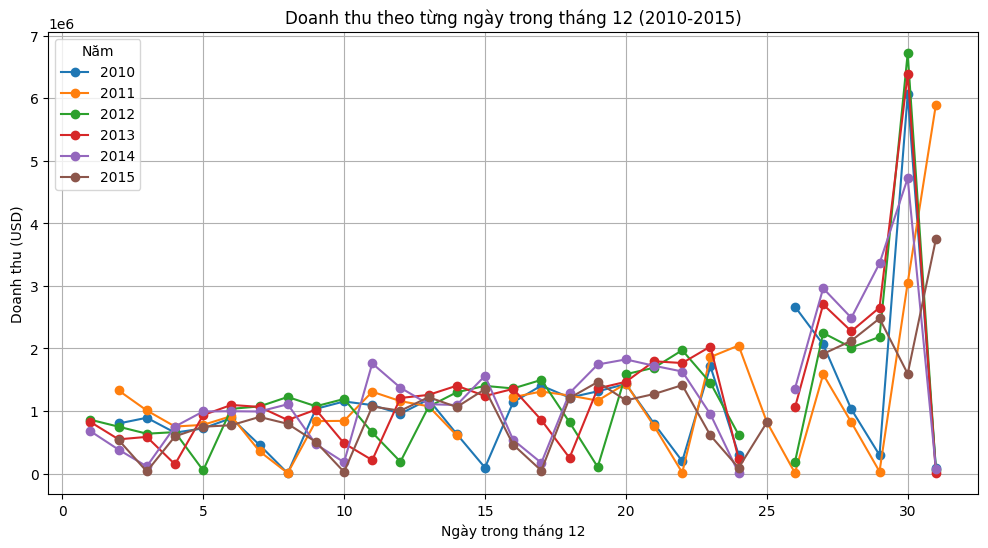

In [66]:
data_jan = data[(data["Date"].dt.month == 12) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 12")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 12 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

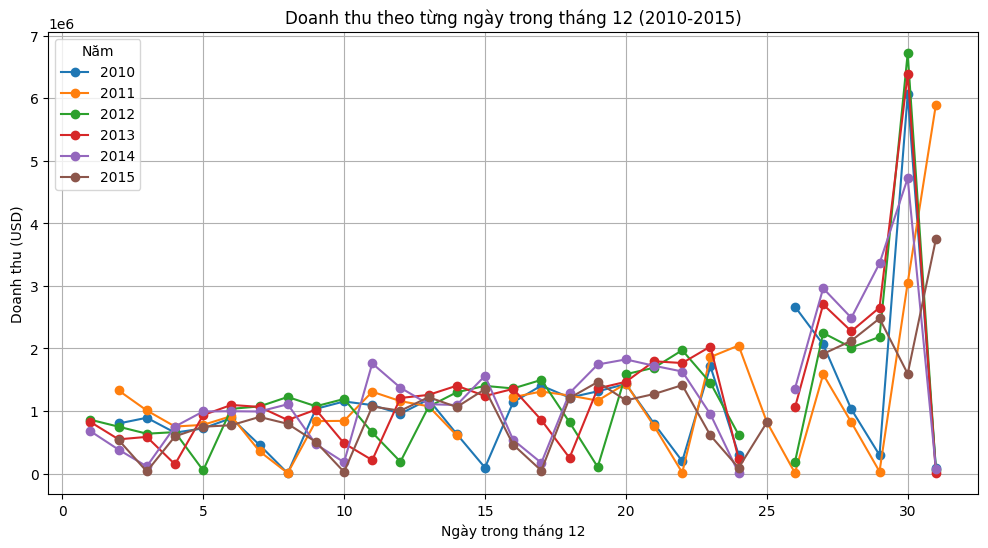

In [67]:
data_jan = data[(data["Date"].dt.month == 12) & (data["Date"].dt.year.isin([2010,2011, 2012, 2013, 2014,2015,2015]))]

# Tổng hợp doanh thu theo từng ngày
data_jan_grouped = data_jan.groupby([data_jan["Date"].dt.year, data_jan["Date"].dt.day])["Revenue"].sum().unstack(level=0)

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
for year in [2010,2011, 2012, 2013, 2014,2015]:
    if year in data_jan_grouped.columns:
        plt.plot(data_jan_grouped.index, data_jan_grouped[year], label=str(year), marker='o')

plt.xlabel("Ngày trong tháng 12")
plt.ylabel("Doanh thu (USD)")
plt.title("Doanh thu theo từng ngày trong tháng 12 (2010-2015)")
plt.legend(title="Năm")
plt.grid(True)
plt.show()

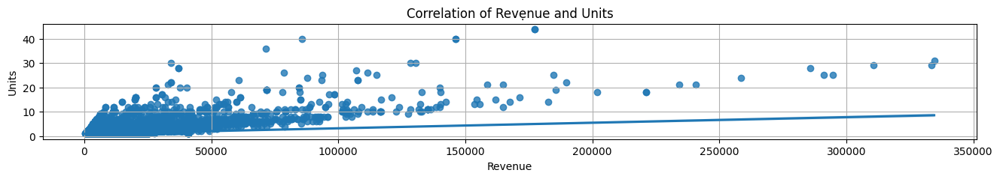

In [68]:
plt.figure(figsize=(16, 2))
snb.regplot(data = data, x = 'Revenue',y = 'Units')
# Thêm tiêu đề và nhãn
plt.title('Correlation of Revẹnue and Units')
plt.xlabel('Revenue')
plt.ylabel('Units')
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


In [69]:
print('Correlation of Profit and Units (r pearson):',data['Revenue'].corr(data['Units']))

Correlation of Profit and Units (r pearson): 0.32597507157625627


In [70]:
GDP_clothes = pd.DataFrame({'Year':[2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021],
                            'Clothing and footwear':[351.3,354.1,344.1,345.0,360.1,368.2,387.1,396.7, 407.2,380.4,494.2]})
GDP_clothes



,Year,Clothing and footwear
0,2011,351.3
1,2012,354.1
2,2013,344.1
3,2014,345.0
4,2015,360.1
5,2016,368.2
6,2017,387.1
7,2018,396.7
8,2019,407.2
9,2020,380.4


In [76]:
west_data = year_data[year_data['Region']=='West']
west_data = west_data.groupby(['State'])[['Revenue', 'Profit', 'Units']].sum().reset_index()

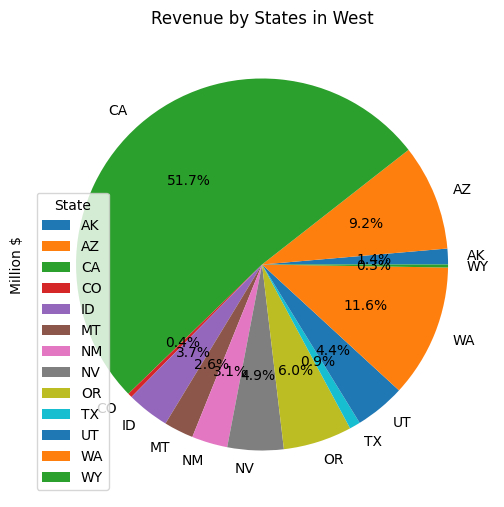

In [78]:
plt.figure(figsize=(6, 14))
plt.pie(west_data['Revenue'], labels = west_data['State'], autopct='%1.1f%%')
plt.xlabel('')
plt.ylabel('Million $')
plt.title('Revenue by States in West')
plt.legend(title='State')
plt.xticks(rotation=45)
plt.show()

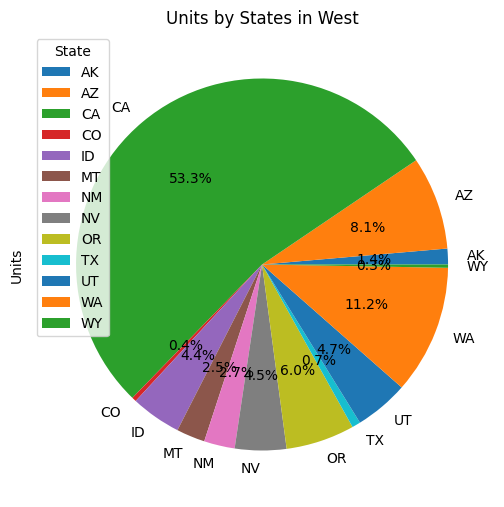

In [77]:
plt.figure(figsize=(6, 14))
plt.pie(west_data['Units'], labels = west_data['State'], autopct='%1.1f%%')
plt.xlabel('')
plt.ylabel('Units')
plt.title('Units by States in West')
plt.legend(title='State')
plt.xticks(rotation=45)
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
snb.boxplot(y = data['Revenue'])
# Thêm tiêu đề và nhãn
plt.title('Boxplot of Revẹnue')
plt.xlabel('Revenue')
plt.ylabel('Amount')
plt.grid(True)

# Hiển thị biểu đồ
plt.show()


In [ ]:
plt.figure(figsize=(16, 4))
snb.lineplot(data=data_segment, x="Month", y="Revenue", hue="Segment", marker="o")

# Tùy chỉnh đồ thị
plt.title("Xu hướng Revenue theo Segment qua từng tháng (2010-2014)", fontsize=14)
plt.xlabel("Thời gian (Tháng)", fontsize=12)
plt.ylabel("Tổng Revenue", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(title="Segment")

# Hiển thị đồ thị
plt.show()

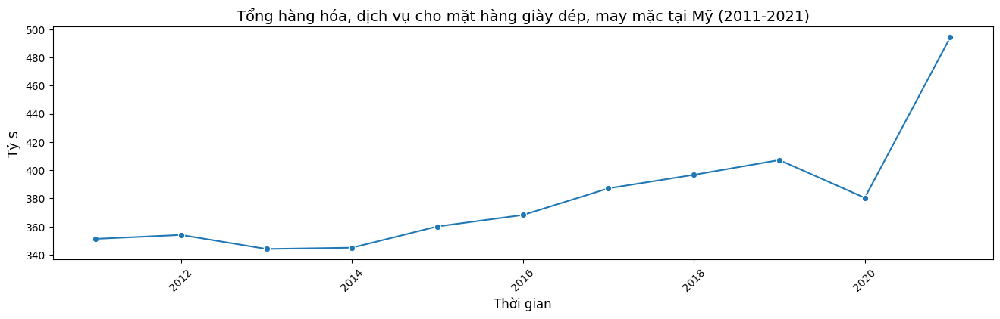

In [74]:
plt.figure(figsize=(16, 4))
snb.lineplot(data= GDP_clothes, x="Year", y="Clothing and footwear", marker="o")

# Tùy chỉnh đồ thị
plt.title("Tổng hàng hóa, dịch vụ cho mặt hàng giày dép, may mặc tại Mỹ (2011-2021)", fontsize=14)
plt.xlabel("Thời gian", fontsize=12)
plt.ylabel("Tỷ $", fontsize=12)
plt.xticks(rotation=45)


# Hiển thị đồ thị
plt.show()